# Выпускная квалификационная работа - 1 Разведочный анализ  данных

1. Провести разведочный анализ предложенных данных
 * нарисовать гистограммы распределения каждой из переменной,
 * диаграммы ящика с усами, попарные графики рассеяния точек.
 * необходимо также для каждой колонке получить среднее, медианное значение, 
 * провести анализ и исключение выбросов,
 * проверить наличие пропусков.     


In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use('seaborn-v0_8-whitegrid')
sns.set_style("whitegrid")

import os

/tmp/ipykernel_8104/3023627012.py:6: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


## Загрузка данных

In [5]:
df_bp = pd.read_excel('data/X_bp_original.xlsx', index_col=0)
df_bp.sample(11)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
303,2.557486,1899.213510,1029.040289,94.656768,17.232202,259.487883,303.472252,72.461391,2312.890280,180.329055
879,2.478739,1865.231920,690.557980,125.164250,18.607306,294.557668,279.027176,74.786845,1889.599157,258.744768
109,3.648693,2008.269311,962.278362,119.509723,18.217982,303.840126,12.040487,73.389639,2684.312583,207.345568
571,2.884592,1978.408952,1200.961642,160.177823,22.220097,320.850106,407.546925,71.543911,2587.231985,165.019036
804,2.398612,1986.168146,1014.994422,89.445178,22.710725,293.617655,531.150643,70.307327,2256.858423,262.072287
995,3.106914,1936.790109,522.757003,112.087095,18.908770,246.180562,409.909361,73.543128,2198.536815,254.154154
89,3.858395,1873.630154,981.863229,102.429378,19.839592,244.802386,876.827541,75.971489,1913.049289,192.197371
868,1.019830,1967.481344,846.448454,107.207380,18.083115,324.982919,267.147526,67.728967,2574.603443,256.106133
329,4.525592,2145.150156,220.514857,104.654774,26.258185,238.599429,126.864941,74.148570,2607.261304,205.832189
822,3.367147,2055.120977,713.015026,135.284461,19.350651,293.730344,854.600528,73.873362,2133.723172,276.821240


In [6]:
pd.DataFrame(df_bp.columns, columns=['признаки базальтопластик'])

,признаки базальтопластик
0,Соотношение матрица-наполнитель
1,"Плотность, кг/м3"
2,"модуль упругости, ГПа"
3,"Количество отвердителя, м.%"
4,"Содержание эпоксидных групп,%_2"
5,"Температура вспышки, С_2"
6,"Поверхностная плотность, г/м2"
7,"Модуль упругости при растяжении, ГПа"
8,"Прочность при растяжении, МПа"
9,"Потребление смолы, г/м2"


In [7]:
print('наблюдений: %i, признаков: %i в X_bp' % df_bp.shape)

наблюдений: 1023, признаков: 10 в X_bp


In [8]:
df_nup = pd.read_excel('data/X_nup_original.xlsx', index_col=0)
df_nup

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,4.000000,57.000000
1,0,4.000000,60.000000
2,0,4.000000,70.000000
3,0,5.000000,47.000000
4,0,5.000000,57.000000
...,...,...,...
1035,90,8.088111,47.759177
1036,90,7.619138,66.931932
1037,90,9.800926,72.858286
1038,90,10.079859,65.519479


In [9]:
pd.DataFrame(df_nup.columns, columns=['признаки нашивок'])

,признаки нашивок
0,"Угол нашивки, град"
1,Шаг нашивки
2,Плотность нашивки


In [10]:
print('строк: %i, признаков: %i в X_nup' % df_nup.shape)

строк: 1040, признаков: 3 в X_nup


In [11]:
df = df_bp.join(df_nup, how='left')
df.sample(8).T

,677,656,543,300,950,319,864,295
Соотношение матрица-наполнитель,1.613418,4.088174,4.681772,2.615309,3.353945,3.113267,1.235544,2.147299
"Плотность, кг/м3",2021.013801,2095.122963,2039.885314,1958.899439,1964.801437,2020.309903,1850.473510,2005.392022
"модуль упругости, ГПа",694.430768,410.585885,1135.141072,652.472287,608.673260,383.006898,1159.930707,403.345184
"Количество отвердителя, м.%",151.884465,126.310771,125.228808,109.271550,163.985672,129.578767,82.865480,128.091809
"Содержание эпоксидных групп,%_2",28.620116,22.393825,24.853192,21.347196,23.393889,20.798849,21.688738,22.226455
"Температура вспышки, С_2",304.360421,292.875211,265.458010,223.953785,276.710021,306.088190,292.738119,264.720550
"Поверхностная плотность, г/м2",791.442174,508.512213,866.023068,503.090273,714.818313,777.962700,611.405489,139.830773
"Модуль упругости при растяжении, ГПа",77.825235,75.706144,70.417629,76.370859,71.237408,69.864261,72.121553,66.052747
"Прочность при растяжении, МПа",1643.893149,2063.293975,2092.136339,1758.176203,3321.035587,2160.777729,2190.466468,2476.576893
"Потребление смолы, г/м2",74.097866,187.082419,271.897909,189.233098,197.328325,290.986464,195.396895,260.040399


In [12]:
print(F'строк: {df.shape[0]}, столбцов: {df.shape[1]} в df, {df_nup.shape[0] - df_bp.shape[0]} строк было отброшено после объединения файлов')

строк: 1023, столбцов: 13 в df, 17 строк было отброшено после объединения файлов


In [13]:
# колонки с вещественными признаками
cols_numerical = df.loc[:, df.columns != 'Угол нашивки, град']
cols_numerical.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,5.0,57.0


In [14]:
column_categorical = df.loc[:, df.columns == 'Угол нашивки, град']
column_categorical.head()

,"Угол нашивки, град"
0,0
1,0
2,0
3,0
4,0


In [15]:
df.info() # Пропуски отсутствуют, тип данных: float64, кроме (Угол нашивки, град) тип: int64, строковых значений нет

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int64  
 11  Шаг нашивки      

In [16]:
df.nunique() # Количество уникальных значений

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки, град                         2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

In [17]:
round((df.nunique() / 1023), 4) * 100 # Количество уникальных значений в процентах dd

Соотношение матрица-наполнитель         99.12
Плотность, кг/м3                        99.02
модуль упругости, ГПа                   99.71
Количество отвердителя, м.%             98.24
Содержание эпоксидных групп,%_2         98.14
Температура вспышки, С_2                98.04
Поверхностная плотность, г/м2           98.14
Модуль упругости при растяжении, ГПа    98.14
Прочность при растяжении, МПа           98.14
Потребление смолы, г/м2                 98.04
Угол нашивки, град                       0.20
Шаг нашивки                             96.68
Плотность нашивки                       96.58
dtype: float64

In [18]:
df.describe().style.format(precision=2)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,1023.00,1023.00,1023.00,1023.00,1023.00,1023.00,1023.00,1023.00,1023.00,1023.00,1023.00,1023.00,1023.00
mean,2.93,1975.73,739.92,110.57,22.24,285.88,482.73,73.33,2466.92,218.42,44.25,6.90,57.15
std,0.91,73.73,330.23,28.30,2.41,40.94,281.31,3.12,485.63,59.74,45.02,2.56,12.35
min,0.39,1731.76,2.44,17.74,14.25,100.00,0.60,64.05,1036.86,33.80,0.00,0.00,0.00
25%,2.32,1924.16,500.05,92.44,20.61,259.07,266.82,71.25,2135.85,179.63,0.00,5.08,49.80
50%,2.91,1977.62,739.66,110.56,22.23,285.90,451.86,73.27,2459.52,219.20,0.00,6.92,57.34
75%,3.55,2021.37,961.81,129.73,23.96,313.00,693.23,75.36,2767.19,257.48,90.00,8.59,64.94
max,5.59,2207.77,1911.54,198.95,33.00,413.27,1399.54,82.68,3848.44,414.59,90.00,14.44,103.99


In [19]:
df['Угол нашивки, град'].value_counts() #'Угол нашивки, град' 2 уникальных занчения

0     520
90    503
Name: Угол нашивки, град, dtype: int64

In [20]:
df['Угол нашивки, град'].value_counts(normalize=True) * 100 # в процентах 

0     50.83089
90    49.16911
Name: Угол нашивки, град, dtype: float64

In [21]:
df.isnull().sum() # пропуски в данных отсутствуют

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

In [22]:
df.duplicated().sum() # дубликаты в данных отсутствуют

0

In [23]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,2.930366,0.913222,0.389403,2.317887,2.906878,3.552660,5.591742
"Плотность, кг/м3",1023.0,1975.734888,73.729231,1731.764635,1924.155467,1977.621657,2021.374375,2207.773481
"модуль упругости, ГПа",1023.0,739.923233,330.231581,2.436909,500.047452,739.664328,961.812526,1911.536477
"Количество отвердителя, м.%",1023.0,110.570769,28.295911,17.740275,92.443497,110.564840,129.730366,198.953207
"Содержание эпоксидных групп,%_2",1023.0,22.244390,2.406301,14.254985,20.608034,22.230744,23.961934,33.000000
"Температура вспышки, С_2",1023.0,285.882151,40.943260,100.000000,259.066528,285.896812,313.002106,413.273418
"Поверхностная плотность, г/м2",1023.0,482.731833,281.314690,0.603740,266.816645,451.864365,693.225017,1399.542362
"Модуль упругости при растяжении, ГПа",1023.0,73.328571,3.118983,64.054061,71.245018,73.268805,75.356612,82.682051
"Прочность при растяжении, МПа",1023.0,2466.922843,485.628006,1036.856605,2135.850448,2459.524526,2767.193119,3848.436732
"Потребление смолы, г/м2",1023.0,218.423144,59.735931,33.803026,179.627520,219.198882,257.481724,414.590628


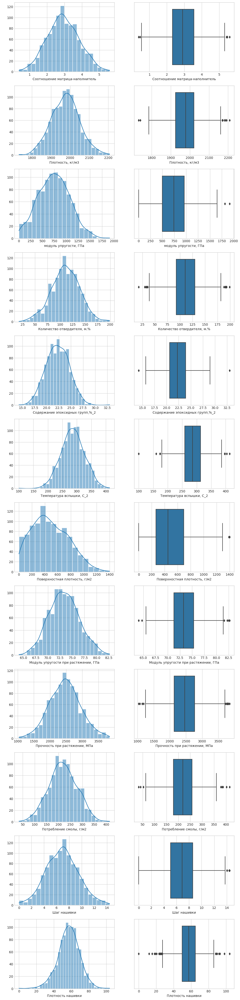

In [24]:
# графики распределения переменных и "ящики с усами"
fig, axes = plt.subplots(cols_numerical.shape[1], 2, figsize=(12, 54))
for el, column in enumerate(cols_numerical):
    axes[el, 0].set(ylabel=' ')
    sns.histplot(data=df, x=column, kde=True, ax=axes[el, 0], )
    sns.boxplot(data=df, x=column, ax=axes[el, 1])
plt.show()

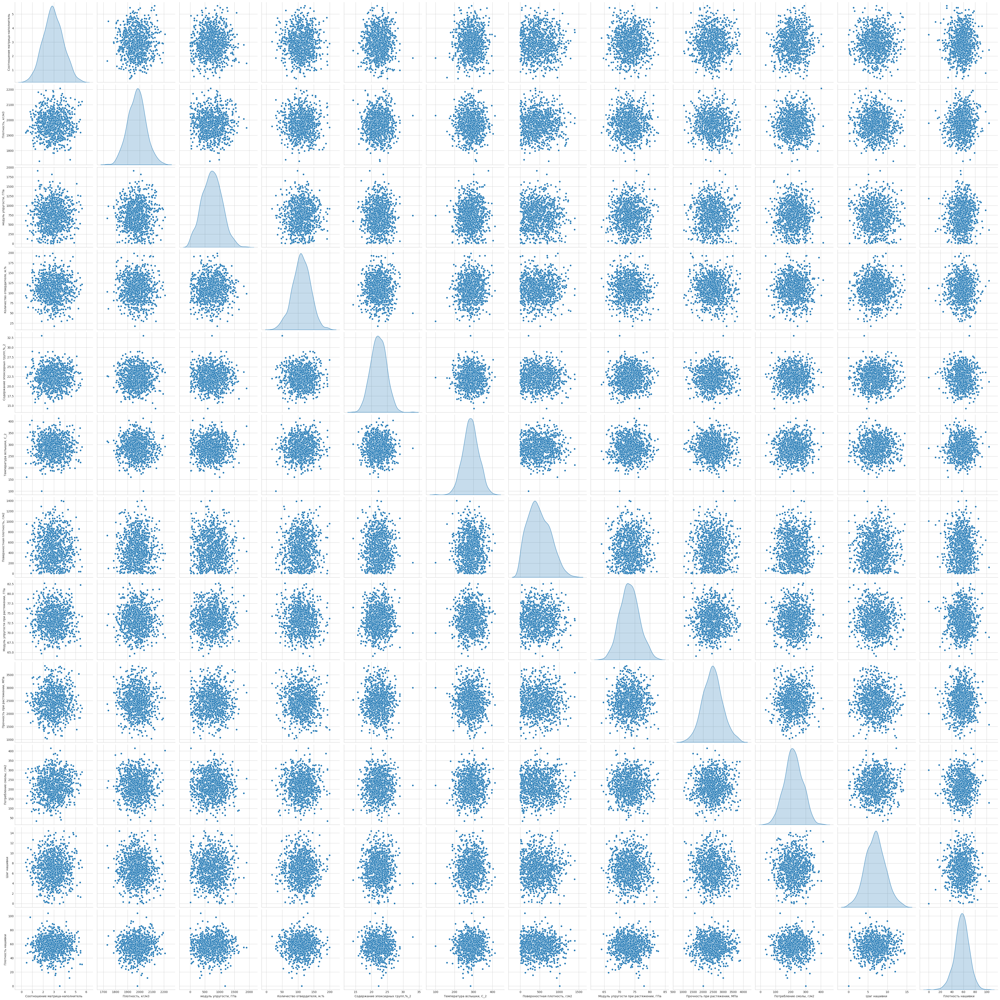

In [25]:
sns.pairplot(cols_numerical, height=4, diag_kind='kde')
plt.show()


In [26]:
# на графиках заметны выбросы
df.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,44.252199,6.899222,57.153929
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,45.015793,2.563467,12.350969
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000,0.000000
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,0.000000,5.080033,49.799212
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,0.000000,6.916144,57.341920
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,90.000000,8.586293,64.944961
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,90.000000,14.440522,103.988901


In [27]:
cols_numerical.skew().sort_values(ascending=False)

Поверхностная плотность, г/м2           0.395466
Модуль упругости при растяжении, ГПа    0.127283
модуль упругости, ГПа                   0.120174
Шаг нашивки                             0.101997
Соотношение матрица-наполнитель         0.082271
Прочность при растяжении, МПа           0.078565
Плотность, кг/м3                        0.058629
Содержание эпоксидных групп,%_2         0.054258
Потребление смолы, г/м2                 0.006294
Температура вспышки, С_2               -0.056526
Количество отвердителя, м.%            -0.086197
Плотность нашивки                      -0.229535
dtype: float64

In [28]:
cols_numerical.kurt().sort_values(ascending=False)

Плотность нашивки                       0.860696
Температура вспышки, С_2                0.187924
Количество отвердителя, м.%             0.145763
Плотность, кг/м3                        0.063629
Содержание эпоксидных групп,%_2         0.042634
Прочность при растяжении, МПа           0.022146
Шаг нашивки                            -0.012810
Потребление смолы, г/м2                -0.124173
Модуль упругости при растяжении, ГПа   -0.161389
Соотношение матрица-наполнитель        -0.199334
модуль упругости, ГПа                  -0.206331
Поверхностная плотность, г/м2          -0.439103
dtype: float64

In [29]:
df.shape[0]

1023

In [30]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
df = df[~((df < (Q1 - 1.5 * IQR) ) | (df > (Q3 + 1.5 * IQR)))]
# количество удаленных выбросов по строкам 
df.isna().sum()

Соотношение матрица-наполнитель          6
Плотность, кг/м3                         9
модуль упругости, ГПа                    2
Количество отвердителя, м.%             14
Содержание эпоксидных групп,%_2          2
Температура вспышки, С_2                 8
Поверхностная плотность, г/м2            2
Модуль упругости при растяжении, ГПа     6
Прочность при растяжении, МПа           11
Потребление смолы, г/м2                  8
Угол нашивки, град                       0
Шаг нашивки                              4
Плотность нашивки                       21
dtype: int64

In [31]:
# всего  удаленных выбросов 
df.isna().sum().sum()

93

In [32]:
df = df.dropna(axis=0).reset_index(drop=True)
df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
1,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
2,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0
3,2.767918,2000.0,748.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,60.0
4,2.569620,1910.0,807.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,70.0


In [33]:
# осталось строк
df.shape[0]

936

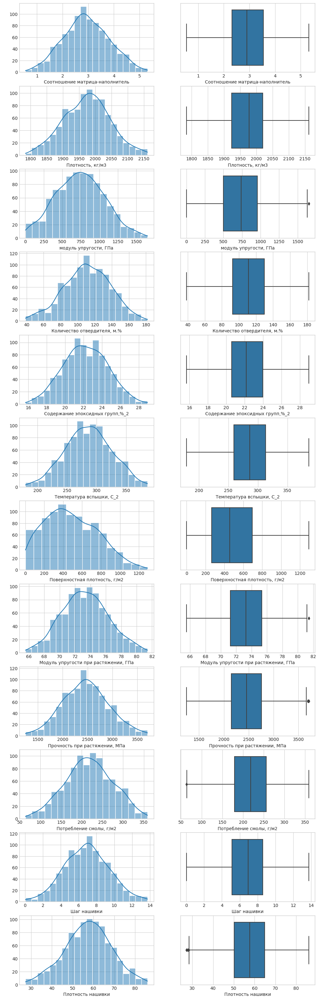

In [34]:
# графики распределения переменных и "ящики с усами" после удаления выбросов
fig, axes = plt.subplots(cols_numerical.shape[1], 2, figsize=(12, 40))
for el, column in enumerate(cols_numerical):
    axes[el, 0].set(ylabel=' ')
    sns.histplot(data=df, x=column, kde=True, ax=axes[el, 0])
    sns.boxplot(data=df, x=column, ax=axes[el, 1])
plt.show()

##  Распределения переменных после удаления выбросов 

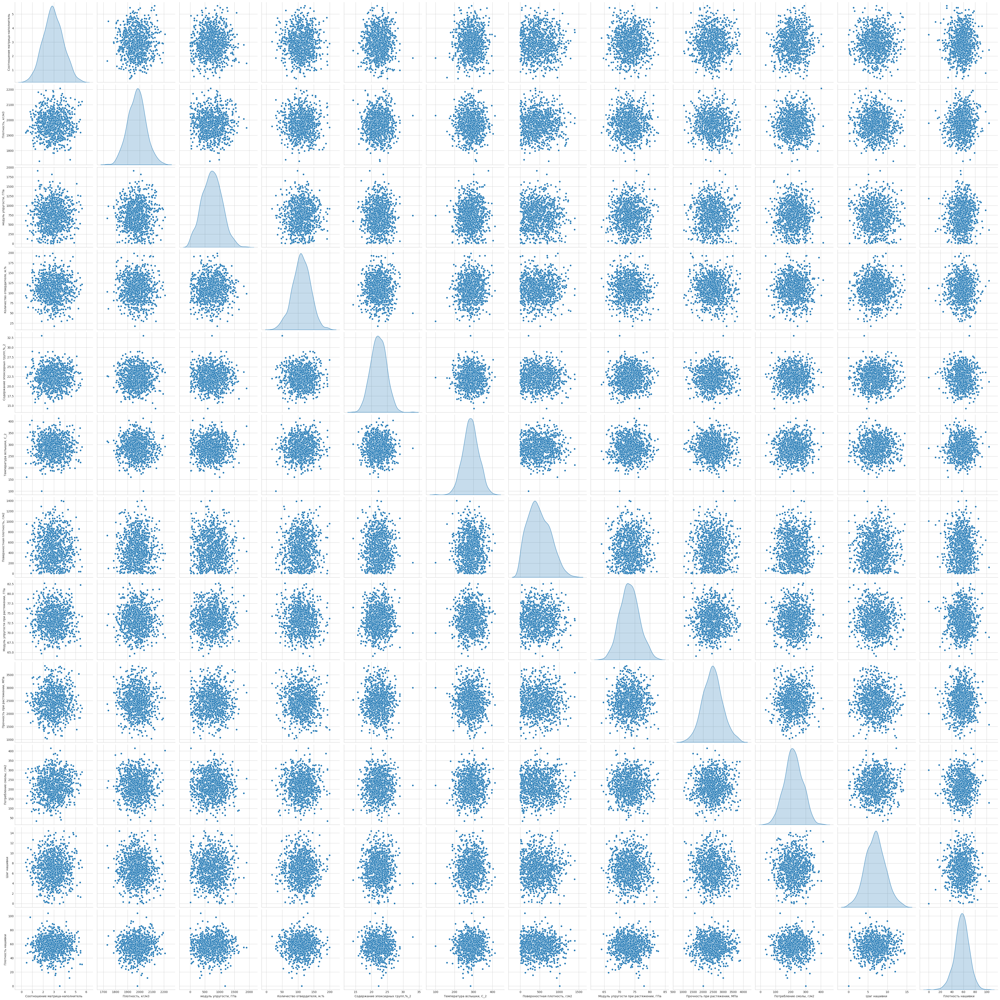

In [35]:
sns.pairplot(cols_numerical, height=4, diag_kind='kde')
plt.show()

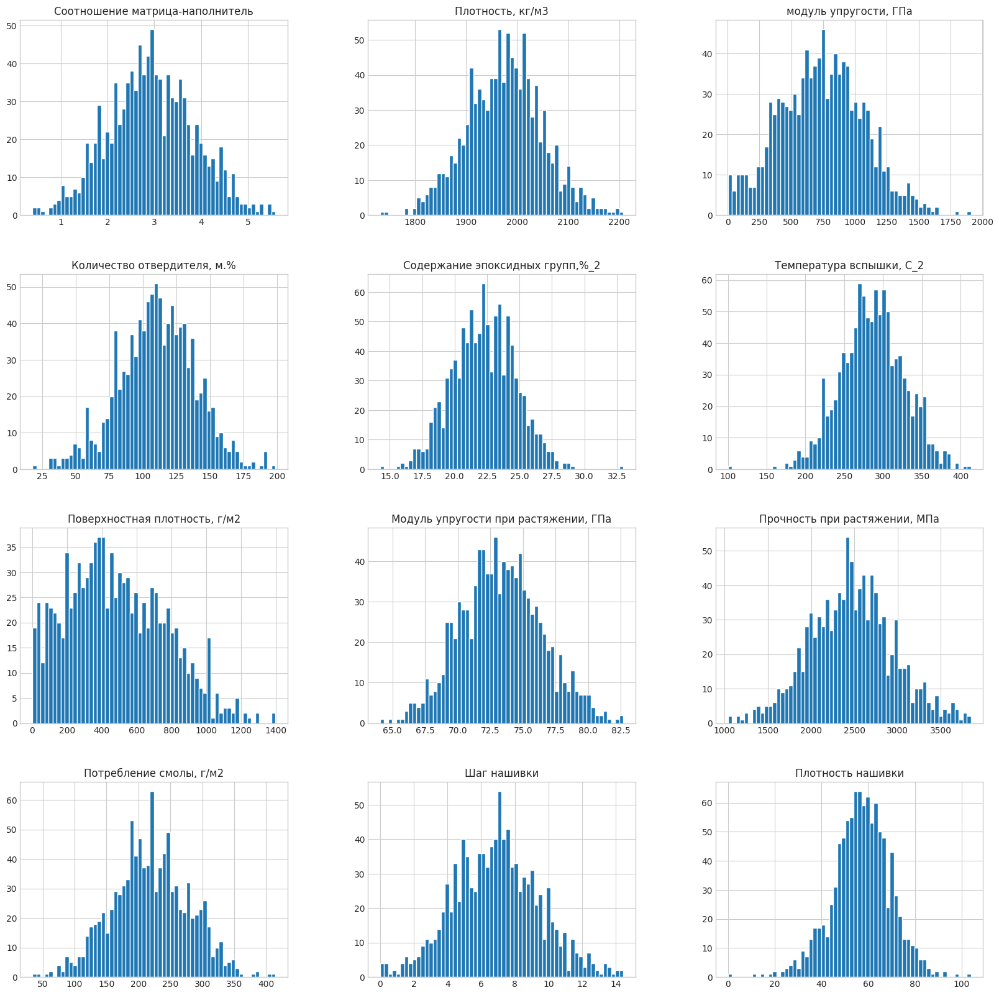

In [36]:
cols_numerical.hist(figsize=(20,20), bins=60)
plt.show()

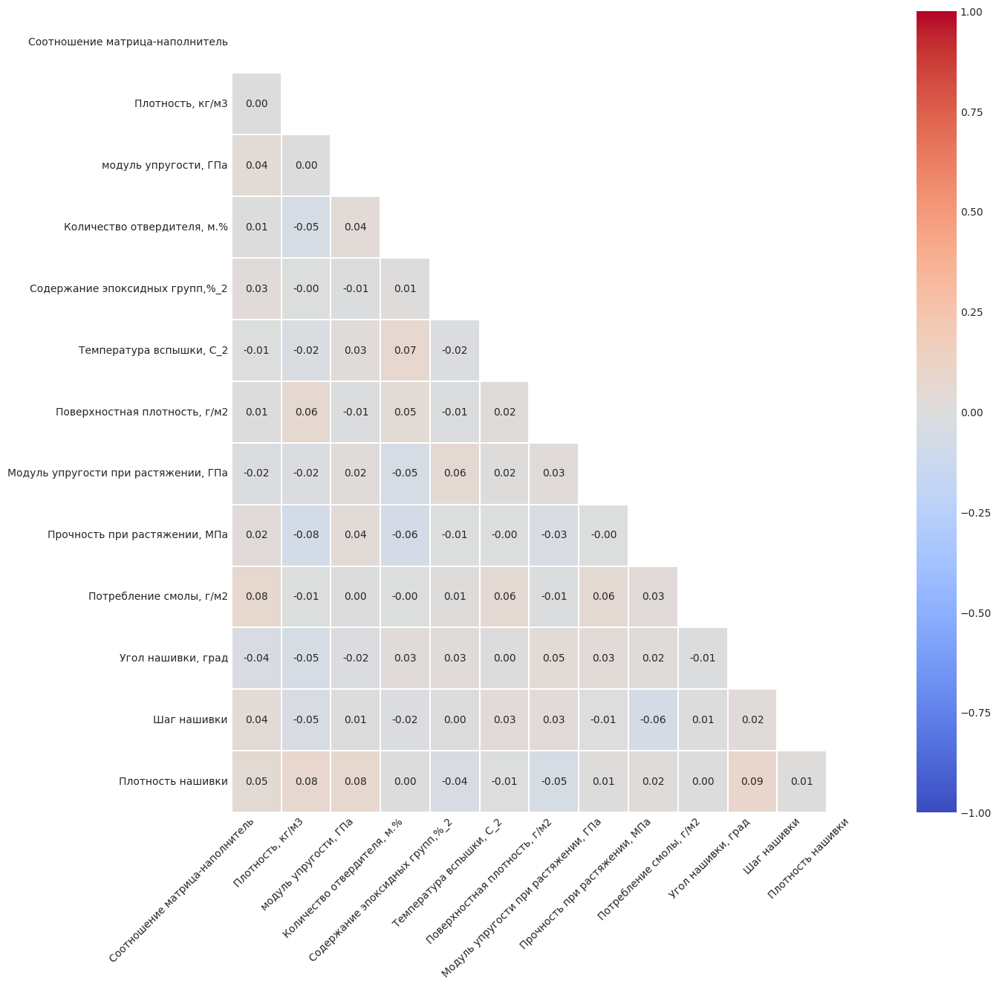

In [37]:
fig, ax = plt.subplots(figsize=(14,14))
mask = np.triu(df.corr())
sns.heatmap(df.corr(), mask=mask, cmap='coolwarm', annot=True, linewidths=0.1 , fmt='.2f', vmin=-1, vmax=1, center=0)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.show()

#### корреляция очень слабая

In [38]:
df.shape

(936, 13)

In [39]:
# Данные очищенные от выбросов - запись в файл xlsx
if os.path.getsize('data/data_outliers_cleaned.xlsx') == 158474:
    print('file exist')
else:
    df.to_excel('data/data_outliers_cleaned.xlsx')

file exist
